# Experimento de Bach

In [1]:
%%bash
pip install -e .

Obtaining file:///home/inb0/Documents/Markov/project
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Checking if build backend supports build_editable: started
  Checking if build backend supports build_editable: finished with status 'done'
  Getting requirements to build editable: started
  Getting requirements to build editable: finished with status 'done'
  Preparing editable metadata (pyproject.toml): started
  Preparing editable metadata (pyproject.toml): finished with status 'done'
  Building editable for mcmg (pyproject.toml): started
  Building editable for mcmg (pyproject.toml): finished with status 'done'
  Created wheel for mcmg: filename=mcmg-0.1.0-0.editable-py3-none-any.whl size=2604 sha256=f9aa81daaf2d94fb23ab9982f2e77f234677875150ffa006afc03b2c7c844721
  Stored in directory: /tmp/pip-ephem-wheel-cache-ahl5107f/wheels/0a/50/f3/dc7488a6c7bef2eeb2cb7ea3abb759cbbd13082f6caa23428f
Successfully built mcmg
  Attempting un

In [2]:
%load_ext autoreload
%autoreload 2

## Bach

### Objetivo

A partir de seis composiciones del compositor de música barroca Johann Sebastian Bach, se pretende generar una nueva obra que conserve el estilo del compositor y suene, a juicio de los oyentes, bien.

Las obras a considerar son las siguientes, todas obtenidas de [midiworld.com](https://www.midiworld.com/bach.htm):
- *Aria from Cantata No. 14.*
- *Concerto in C*
- *Sonata - Largo e dulce*
- *The Well-Tempered Klavier Book II Prelude II*
- *Sheep May Safely Graze*
- *Passacaglia & Fugue in C minor*

In [11]:
from mcmg.instrument import Instrument
from mcmg.parser import Parser
from mcmg.event import Event
import os

print(os.listdir("Data/bach"))
tracks: list[str] = [f"Data/bach/{file}" for file in os.listdir("Data/bach") if file.endswith("mxl")]
parsed_dicts: list[dict] = []
for file_track in tracks:
    parser = Parser(file_track, data_dir="Data/bach")
    parsed_dicts.append(parser.parse_to_dict())

inst = Instrument(parsed_mxls=parsed_dicts, voices=[1, 2])
inst.build_tm(order=5)
comp: list[list[Event]] = inst.compose(n_simulations=50)
inst.to_midi(comp, "output/bach/test.mid", instruments=['harpsichord', 'organ'])

['jsbpassc.mxl', 'jsbpassc.mid', 'aria14.mid', 'bwv1032b.mxl', 'preludii_score.xml', 'aria14.mxl', 'preludii.mid', 'bwv1032b.mid', 'sheep.mid', 'jsbpassc_score.xml', 'bwv976.mxl', 'bwv976.mid', 'sheep.mxl', 'bwv1032b_score.xml', 'preludii.mxl', 'sheep_score.xml', 'bwv976_score.xml', 'aria14_score.xml']
jsbpassc_score.xml found in the Data/ folder. Skipping conversion to xml.
Data/bach/jsbpassc_score.xml
Instrument: Bass Clarinet
Clefs: {'1': ('G', 2)}
Instrument: Piano
Clefs: {'1': ('G', 2), '2': ('G', 2)}
Clefs: {'1': ('F', 4), '2': ('G', 2)}
Clefs: {'1': ('G', 2), '2': ('G', 2)}
Clefs: {'1': ('F', 4), '2': ('G', 2)}
Clefs: {'1': ('F', 4), '2': ('F', 4)}
Clefs: {'1': ('F', 4), '2': ('F', 4)}
Clefs: {'1': ('F', 4), '2': ('G', 2)}
Clefs: {'1': ('F', 4), '2': ('G', 2)}
Clefs: {'1': ('F', 4), '2': ('G', 2)}
Clefs: {'1': ('F', 4), '2': ('F', 4)}
Clefs: {'1': ('F', 4), '2': ('F', 4)}
Clefs: {'1': ('F', 4), '2': ('G', 2)}
Instrument: Contrabassoon
Clefs: {'1': ('F', 4)}
bwv1032b_score.xml fo

In [ ]:
import pretty_midi
from IPython.display import Audio
import soundfile as sf  

def play_midi(file_path: str, save_path: str = None, fs: int = 44100) -> None:
    """
    Play the MIDI file in `file_path` in a Jupyter notebook
    optionally saving the output audio file (with .wav extension) in
    `save_path`.wav
    """
    pm = pretty_midi.PrettyMIDI(file_path)
    audio = pm.fluidsynth(fs=44100, synthesizer="fonts/GeneralUser_GS_v1.471.sf2")

    if save_path:
        sf.write("output/test.wav", audio, 44100)
        display(Audio("output/test.wav"))
    else:
        display(Audio(audio, rate=44100))


play_midi("output/bach/test.mid")


## Mozart y Beethoven

### Objetivo

A partir de seis composiciones de los compositores de música clásica Ludwig van Beethoven y Wolfgang Amadeus Mozart (tres de cada uno), se pretende generar una nueva obra que mezcle el estilo de ambos autores sin que suene a un revuelto de música mal hecho.

Las obras a considerar son las siguientes, obtenidas de [midiworld.com](https://www.midiworld.com/bach.htm), [BitMidi1](https://bitmidi.com/) y de [kuntsderfuge](https://www.kunstderfuge.com/mozart.htm#Sonatas):
- *Minuet in G* (L.B.)
- *Violin Sonata No. 1 *(L.B.)
- *Für Elise* (L.B.)
- *Turkish March* en Mi menor (W.M.)
- *Ave Verum Corpus* (W.M.)
- *Piano sonata No. 11* (W.M.)

In [65]:
from mcmg.instrument import Instrument
from mcmg.parser import Parser
from mcmg.event import Event
import os

tracks: list[str] = [f"Data/mozart/{file}" for file in os.listdir("Data/mozart") if file.endswith("mxl")]
tracks.extend([f"Data/beethoven/{file}" for file in os.listdir("Data/beethoven") if file.endswith("mxl")])
print(len(tracks), tracks)
parsed_dicts: list[dict] = []
for file_track in tracks:
    parser = Parser(file_track, data_dir="Data/mozart")
    parsed_dicts.append(parser.parse_to_dict())

inst = Instrument(parsed_mxls=parsed_dicts, voices=[1, 2])
inst.build_tm(order=1)
comp: list[list[Event]] = inst.compose(n_simulations=50)
inst.to_midi(comp, "output/lbwm/test.mid", instruments=['trumpet', 'drums'])

play_midi("output/lbwm/test.mid")

6 ['Data/mozart/mozart_-_Turkish_March_in_Eb.mxl', 'Data/mozart/piano_sonata_11.mxl', 'Data/mozart/Mozart_Wolfgang_Amadeus_-_Ave_Verum_Corpus_(string_quintet).mxl', 'Data/beethoven/beethoven-minuet-in-G.mxl', 'Data/beethoven/Furelise-Beethoven.mxl', 'Data/beethoven/Beethoven-violin-sonata1-1-piano.mxl']
File list: ['META-INF/container.xml', 'mozart_-_Turkish_March_in_Eb.xml']
Score path: mozart_-_Turkish_March_in_Eb.xml
Data/mozart/mozart_-_Turkish_March_in_Eb_score.xml
Instrument: Piano, Piano right
Clefs: {'1': ('G', 2), '2': ('F', 4)}
File list: ['META-INF/container.xml', 'piano_sonata_11.xml']
Score path: piano_sonata_11.xml
Data/mozart/piano_sonata_11_score.xml
Instrument: Piano, PIANO
Clefs: {'1': ('G', 2), '2': ('G', 2)}
Clefs: {'1': ('G', 2), '2': ('F', 4)}
Clefs: {'1': ('G', 2), '2': ('G', 2)}
Clefs: {'1': ('G', 2), '2': ('F', 4)}
Clefs: {'1': ('G', 2), '2': ('G', 2)}
Clefs: {'1': ('G', 2), '2': ('F', 4)}
Clefs: {'1': ('G', 2), '2': ('G', 2)}
Clefs: {'1': ('G', 2), '2': ('F', 

In [7]:
!pip install matplotlib

  Using cached matplotlib-3.10.7-cp313-cp313-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (11 kB)
  Using cached contourpy-1.3.3-cp313-cp313-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (5.5 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached fonttools-4.61.0-cp313-cp313-manylinux1_x86_64.manylinux2014_x86_64.manylinux_2_17_x86_64.manylinux_2_5_x86_64.whl.metadata (113 kB)
  Using cached kiwisolver-1.4.9-cp313-cp313-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (6.3 kB)
  Using cached pillow-12.0.0-cp313-cp313-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (8.8 kB)
  Using cached pyparsing-3.2.5-py3-none-any.whl.metadata (5.0 kB)
Using cached matplotlib-3.10.7-cp313-cp313-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (8.7 MB)
Using cached contourpy-1.3.3-cp313-cp313-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl (362 kB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
Using cached fonttools-4.61.0-cp313-cp

## Análisis gráfico

In [1]:
import pandas as pd

Total de encuestados: 11
          Parecido  Calidad
Pieza                      
order1    4.000000      4.0
order1.2  4.954545      5.7
order3    6.272727      5.9
order3.2  7.090909      7.4
order5    6.000000      5.8
order5.2  5.545455      5.3


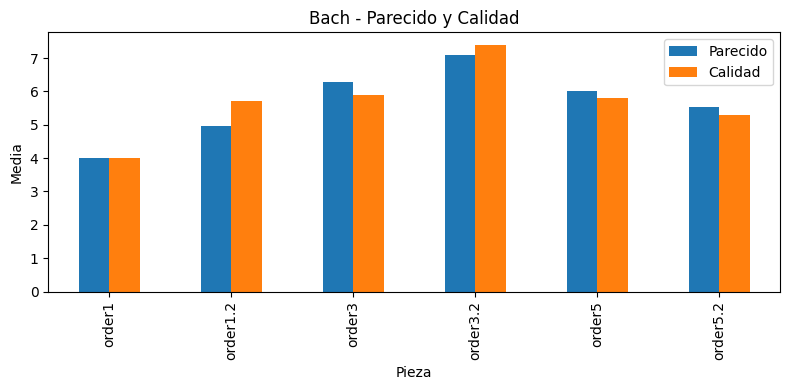

Total de encuestados: 11
          Parecido  Calidad
Pieza                      
order1    2.909091      3.5
order1.2  2.363636      3.8
order3    4.363636      3.9
order3.2  5.454545      4.1
order5    3.818182      3.6
order5.2  4.909091      4.5


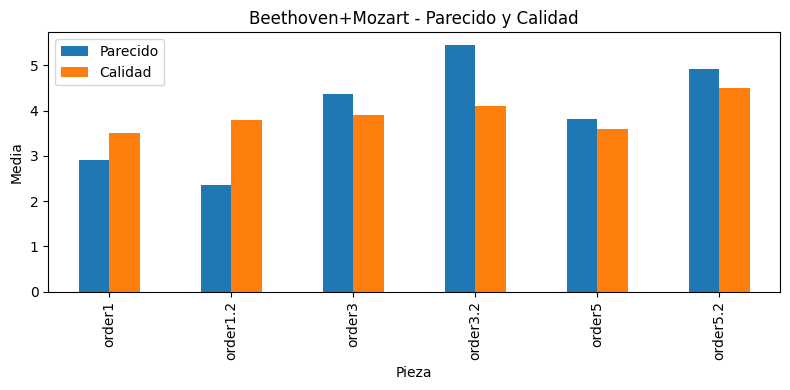

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

bach = pd.read_csv("poll/Encuestas_Markov - Bach.csv")
lbwm = pd.read_csv("poll/Encuestas_Markov - Beethoven+Mozart.csv")

def plot_totals(df, title):
    print("Total de encuestados:", len(df.groupby("Nombre")))
    grouped = df.groupby("Pieza")[["Parecido", "Calidad"]].mean()
    print(grouped)
    ax = grouped.plot(kind="bar", figsize=(8, 4), title=title, ylabel="Media")
    ax.set_xlabel("Pieza")
    plt.tight_layout()
    plt.show()

plot_totals(bach, "Bach - Parecido y Calidad")
plot_totals(lbwm, "Beethoven+Mozart - Parecido y Calidad")
